In [ ]:
import cv2
import matplotlib.pyplot as plt
import glob
import random
import os
from google.colab.patches import cv2_imshow

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# install ultralytics
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.6/755.6 kB 9.0 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-many

In [ ]:
# Function to convert bounding boxes in YOLO format to x_min, y_min, x_max, y_max.

def yolo2bbox(bboxes):
    """
    Argument: bboxes
    The function takes bboxes as input containing the YOLO bounding box coordinates.
    It then calculates the (xmin, ymin) and (xmax, ymax) coordinates of the bounding box.
    Returns the coordinates: xmin, ymin, xmax, ymax
    """

    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

In [ ]:
# Function to plot the bounding boxes.

def plot_box(image, bboxes, labels):
    """
    Arguments:  image - an input image,
                bboxes - a list of bounding boxes in YOLO format,
                labels - a list of labels corresponding to each bounding box.
    The function plots the bounding boxes on the image using OpenCV (cv2).
    Returns the modified image.
    """

    # Need the image height and width to denormalize the bounding box coordinates
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)

        # Denormalize the coordinates.
        xmin = int(x1*w)
        ymin = int(y1*h)
        xmax = int(x2*w)
        ymax = int(y2*h)

        # calculate the thickness of the bounding box lines based on the image width
        # to make sure the boxes are visible in the plot.
        thickness = max(2, int(w/275))

        # draw a rectangle on the image
        cv2.rectangle(
            image,
            (xmin, ymin), (xmax, ymax),
            #  color (0, 0, 255) -> red
            color=(0, 0, 255),
            thickness=thickness
        )
    return image

In [ ]:
# Function to plot images with the bounding boxes.

def plot(image_paths, label_paths, num_samples):
    """
    Arguments:  image_paths - the path to the folder containing the images.
                label_paths - the path to the folder containing the label files for the corresponding images.
                num_samples - the number of random samples to visualize.
    The function helps to visualize a random selection of images along with their bounding boxes and labels.
    """

    all_images = []     #  initialize an empty list to store the paths of all the image files

    # the glob module is used to find image files (with ".jpg" or ".JPG" extensions) in the specified image_paths folder
    # and append them to all_images.
    all_images.extend(glob.glob(image_paths+'/*.jpg'))
    all_images.extend(glob.glob(image_paths+'/*.JPG'))

    all_images.sort()   # sort the all_images list to ensure a consistent order of images during random selection.

    num_images = len(all_images)    # find the number of images in all_images list

    plt.figure(figsize=(15, 12))    # create a plot of 15x12 inches

    for i in range(num_samples):
        j = random.randint(0,num_images-1)  # variable j represents the index of the image that will be randomly selected
        image_name = all_images[j]
        image_name = '.'.join(image_name.split(os.path.sep)[-1].split('.')[:-1])
        image = cv2.imread(all_images[j])   # read the image corresponding to the index j.

        # open the label file associated with the selected image (based on the image name)
        # read the bounding box coordinates and labels for each object present in the image.
        with open(os.path.join(label_paths, image_name+'.txt'), 'r') as f:
            bboxes = []     # initialize an empty list to store the bounding box coordinates that are extracted from the label files.
            labels = []     # initialize an empty list to store the labels that are extracted from the label files.
            label_lines = f.readlines()
            for label_line in label_lines:
                label = label_line[0]
                bbox_string = label_line[2:]
                x_c, y_c, w, h = bbox_string.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels)  # call the plot_box function to draw the bounding boxes and labels on the image.
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])    # reverse the order of color channels. OpenCV uses BGR color order. Matplotlib uses RGB color order.
        plt.axis('off')
    plt.subplots_adjust(wspace=1)
    plt.tight_layout()
    plt.show()

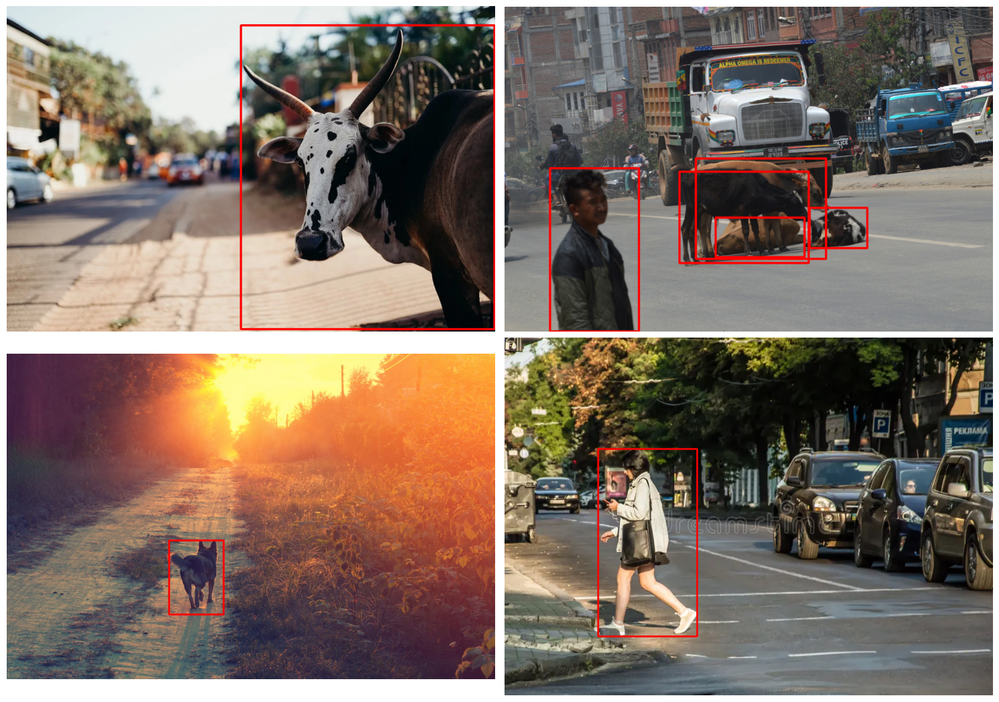

In [ ]:
# Visualize a few training images.

plot(
    image_paths='/content/drive/MyDrive/adl_project/dataset/train/images',
    label_paths='/content/drive/MyDrive/adl_project/dataset/train/labels',
    num_samples=4,
)

In [ ]:
ROOT_DIR='/content/drive/MyDrive/adl_project/dataset'

In [ ]:
import os
from ultralytics import YOLO
model=YOLO('yolov8n.pt')
results=model.train(data=os.path.join(ROOT_DIR,'Objdetection_v8.yaml'),epochs=100)

100%|██████████| 6.23M/6.23M [00:00<00:00, 77.4MB/s]


Ultralytics YOLOv8.2.10 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/adl_project/dataset/Objdetection_v8.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show

100%|██████████| 755k/755k [00:00<00:00, 15.9MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/drive/MyDrive/adl_project/dataset/train/labels.cache... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/adl_project/dataset/val/labels.cache... 20 images, 0 backgrounds, 0 corrupt: 100%|██████████| 20/20 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100         0G     0.9019      3.122      1.097         44        640: 100%|██████████| 4/4 [01:17<00:00, 19.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:19<00:00, 19.32s/it]

                   all         20         65     0.0101      0.888      0.312      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100         0G     0.9386      2.989      1.106         53        640: 100%|██████████| 4/4 [00:53<00:00, 13.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.48s/it]

                   all         20         65     0.0115      0.977      0.459      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100         0G     0.9337      2.578       1.11         41        640: 100%|██████████| 4/4 [00:53<00:00, 13.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.10s/it]

                   all         20         65     0.0115      0.972      0.522      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100         0G     0.9689      1.957      1.117         49        640: 100%|██████████| 4/4 [00:50<00:00, 12.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.87s/it]

                   all         20         65      0.414      0.753      0.621      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100         0G     0.8909      1.709      1.079         52        640: 100%|██████████| 4/4 [00:50<00:00, 12.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.78s/it]

                   all         20         65       0.89      0.242       0.67      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100         0G     0.9888      1.649      1.102         49        640: 100%|██████████| 4/4 [00:54<00:00, 13.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.43s/it]

                   all         20         65      0.809      0.396      0.715      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100         0G     0.9384      1.545      1.085         67        640: 100%|██████████| 4/4 [00:52<00:00, 13.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.67s/it]

                   all         20         65      0.823      0.478      0.738       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100         0G     0.8542      1.368      1.026         71        640: 100%|██████████| 4/4 [00:51<00:00, 12.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.89s/it]

                   all         20         65      0.839      0.368       0.77      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100         0G     0.9013      1.304      1.047         77        640: 100%|██████████| 4/4 [00:53<00:00, 13.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.39s/it]

                   all         20         65      0.794      0.352      0.773      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100         0G     0.8843      1.364       1.07         65        640: 100%|██████████| 4/4 [00:53<00:00, 13.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.12s/it]

                   all         20         65      0.845      0.403      0.801      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100         0G     0.9276      1.334      1.108         43        640: 100%|██████████| 4/4 [00:50<00:00, 12.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.81s/it]

                   all         20         65      0.913      0.358      0.796      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100         0G     0.8773      1.216      1.103         69        640: 100%|██████████| 4/4 [00:52<00:00, 13.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.27s/it]

                   all         20         65      0.881      0.375      0.716      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100         0G     0.8741      1.316      1.078         79        640: 100%|██████████| 4/4 [00:53<00:00, 13.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.46s/it]

                   all         20         65       0.93      0.415      0.749      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100         0G     0.8929      1.239      1.068         41        640: 100%|██████████| 4/4 [00:59<00:00, 14.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.78s/it]

                   all         20         65      0.947       0.47      0.762      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100         0G     0.8973      1.219      1.062         64        640: 100%|██████████| 4/4 [00:52<00:00, 13.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.97s/it]

                   all         20         65       0.88      0.454      0.775      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100         0G     0.8804       1.18      1.058         51        640: 100%|██████████| 4/4 [00:57<00:00, 14.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.40s/it]

                   all         20         65      0.857      0.515      0.744      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100         0G       0.83      1.073      1.031         46        640: 100%|██████████| 4/4 [00:52<00:00, 13.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.56s/it]

                   all         20         65       0.79      0.566      0.686      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100         0G     0.8901       1.23      1.087         58        640: 100%|██████████| 4/4 [00:52<00:00, 13.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.75s/it]

                   all         20         65      0.852      0.319      0.682      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100         0G     0.8987      1.151      1.057         62        640: 100%|██████████| 4/4 [00:51<00:00, 12.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.05s/it]

                   all         20         65      0.835       0.22      0.623      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100         0G     0.8422      1.182      1.076         46        640: 100%|██████████| 4/4 [00:53<00:00, 13.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.44s/it]

                   all         20         65      0.735       0.22      0.578      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100         0G     0.9139      1.127      1.078         74        640: 100%|██████████| 4/4 [00:53<00:00, 13.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.47s/it]

                   all         20         65      0.753      0.284       0.45      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100         0G     0.8882      1.174      1.141         37        640: 100%|██████████| 4/4 [00:53<00:00, 13.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.61s/it]

                   all         20         65      0.848      0.275      0.439      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100         0G     0.9034      1.133      1.058         60        640: 100%|██████████| 4/4 [00:53<00:00, 13.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.40s/it]

                   all         20         65      0.777      0.239      0.386      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100         0G      0.927      1.172      1.104         69        640: 100%|██████████| 4/4 [00:52<00:00, 13.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.76s/it]

                   all         20         65      0.829      0.286      0.398      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100         0G     0.8605      1.075      1.063         52        640: 100%|██████████| 4/4 [00:51<00:00, 12.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.79s/it]

                   all         20         65      0.603      0.331      0.489      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100         0G     0.9009       1.13      1.099         72        640: 100%|██████████| 4/4 [00:59<00:00, 14.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.53s/it]

                   all         20         65      0.616      0.481      0.565      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100         0G     0.8845      1.083      1.074         94        640: 100%|██████████| 4/4 [00:53<00:00, 13.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.73s/it]

                   all         20         65      0.692      0.629      0.643      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100         0G     0.8159      1.071      1.066         55        640: 100%|██████████| 4/4 [00:50<00:00, 12.71s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.83s/it]

                   all         20         65      0.777      0.642       0.74      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100         0G      0.811       1.04      1.053         56        640: 100%|██████████| 4/4 [00:52<00:00, 13.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.65s/it]

                   all         20         65      0.737      0.704      0.772      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100         0G     0.8585      1.024      1.044         73        640: 100%|██████████| 4/4 [00:59<00:00, 14.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.78s/it]

                   all         20         65      0.735      0.727      0.794      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100         0G     0.8207     0.9897      1.036         59        640: 100%|██████████| 4/4 [00:51<00:00, 12.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.12s/it]

                   all         20         65      0.849      0.657      0.754      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100         0G     0.8779      1.014      1.046         60        640: 100%|██████████| 4/4 [00:54<00:00, 13.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.29s/it]

                   all         20         65      0.817      0.668       0.72      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100         0G     0.8625          1       1.03         76        640: 100%|██████████| 4/4 [00:53<00:00, 13.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.67s/it]

                   all         20         65      0.827      0.693      0.719      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100         0G     0.7865     0.9036      1.023         71        640: 100%|██████████| 4/4 [00:53<00:00, 13.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.06s/it]

                   all         20         65      0.799       0.62       0.68       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100         0G     0.8471      1.031      1.032         79        640: 100%|██████████| 4/4 [00:53<00:00, 13.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.73s/it]

                   all         20         65      0.711      0.611      0.646      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100         0G     0.8077     0.9869      1.043         71        640: 100%|██████████| 4/4 [00:58<00:00, 14.54s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.20s/it]

                   all         20         65      0.701       0.59      0.629       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100         0G     0.8444     0.9768      1.074         58        640: 100%|██████████| 4/4 [00:50<00:00, 12.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.82s/it]

                   all         20         65      0.703      0.561       0.59      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100         0G     0.8404      1.001      1.041         54        640: 100%|██████████| 4/4 [00:54<00:00, 13.57s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.75s/it]

                   all         20         65       0.64      0.557      0.549       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100         0G     0.8007     0.9941      1.032         47        640: 100%|██████████| 4/4 [00:54<00:00, 13.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.25s/it]

                   all         20         65      0.728      0.497      0.565      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100         0G     0.8464      1.016      1.042         82        640: 100%|██████████| 4/4 [00:50<00:00, 12.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.73s/it]

                   all         20         65      0.661      0.582      0.596      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100         0G     0.7827     0.9599      1.028         77        640: 100%|██████████| 4/4 [00:51<00:00, 12.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.76s/it]

                   all         20         65      0.717      0.662      0.661      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100         0G     0.7358     0.8934     0.9809         49        640: 100%|██████████| 4/4 [00:57<00:00, 14.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.72s/it]

                   all         20         65      0.792      0.621       0.68      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100         0G     0.8024     0.9362      1.044         64        640: 100%|██████████| 4/4 [00:51<00:00, 12.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.73s/it]

                   all         20         65      0.771       0.61      0.655      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100         0G     0.7239     0.8859     0.9986         53        640: 100%|██████████| 4/4 [00:52<00:00, 13.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.63s/it]

                   all         20         65      0.732       0.64      0.688       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100         0G     0.7889     0.9468      1.054         51        640: 100%|██████████| 4/4 [00:56<00:00, 14.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.64s/it]

                   all         20         65      0.804        0.6      0.694      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100         0G     0.7657     0.9436      1.031         70        640: 100%|██████████| 4/4 [00:54<00:00, 13.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.65s/it]

                   all         20         65       0.66      0.699      0.695      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100         0G     0.7518     0.9314      1.013         53        640: 100%|██████████| 4/4 [00:55<00:00, 13.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.05s/it]

                   all         20         65      0.766       0.68      0.709      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100         0G     0.8027     0.9251      1.063         50        640: 100%|██████████| 4/4 [00:52<00:00, 13.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.05s/it]

                   all         20         65      0.831       0.69      0.713      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100         0G      0.812     0.9832      1.055         66        640: 100%|██████████| 4/4 [00:54<00:00, 13.62s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.54s/it]

                   all         20         65      0.772      0.814      0.801      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100         0G      0.743     0.8422      1.011         58        640: 100%|██████████| 4/4 [00:57<00:00, 14.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.13s/it]

                   all         20         65      0.829      0.778      0.832      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100         0G     0.7422     0.9067      1.042         67        640: 100%|██████████| 4/4 [00:55<00:00, 13.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.51s/it]

                   all         20         65       0.81      0.799      0.833      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100         0G      0.737     0.8401      1.024         59        640: 100%|██████████| 4/4 [00:53<00:00, 13.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.89s/it]

                   all         20         65      0.687      0.782       0.75      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100         0G     0.7217     0.8572     0.9785         73        640: 100%|██████████| 4/4 [00:52<00:00, 13.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.72s/it]

                   all         20         65      0.708      0.711      0.719      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100         0G     0.7176     0.8414     0.9941         51        640: 100%|██████████| 4/4 [00:55<00:00, 13.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.61s/it]

                   all         20         65       0.74      0.649      0.719      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100         0G     0.7383     0.8656      1.012         76        640: 100%|██████████| 4/4 [00:53<00:00, 13.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.49s/it]

                   all         20         65      0.737      0.667      0.707      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100         0G     0.7015     0.8396      1.025         48        640: 100%|██████████| 4/4 [00:56<00:00, 14.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.88s/it]

                   all         20         65      0.771       0.61      0.696      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100         0G     0.7074     0.8121      0.986         47        640: 100%|██████████| 4/4 [00:52<00:00, 13.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.01s/it]

                   all         20         65      0.716      0.645      0.684      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100         0G     0.6688     0.8047     0.9806         68        640: 100%|██████████| 4/4 [00:52<00:00, 13.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.92s/it]

                   all         20         65      0.645      0.688       0.71      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100         0G      0.656     0.7492       0.98         66        640: 100%|██████████| 4/4 [00:53<00:00, 13.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.21s/it]

                   all         20         65      0.699      0.641      0.718      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100         0G     0.6805     0.7887      0.975         65        640: 100%|██████████| 4/4 [00:53<00:00, 13.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.50s/it]

                   all         20         65      0.726      0.706      0.755       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100         0G     0.6703     0.7831     0.9832         60        640: 100%|██████████| 4/4 [00:52<00:00, 13.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.70s/it]

                   all         20         65      0.745      0.732      0.779      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100         0G      0.673     0.7736     0.9805         47        640: 100%|██████████| 4/4 [00:51<00:00, 12.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.75s/it]

                   all         20         65      0.776      0.724       0.81      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100         0G     0.7202     0.8067      1.026         46        640: 100%|██████████| 4/4 [00:52<00:00, 13.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.98s/it]

                   all         20         65      0.765      0.736      0.805      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100         0G     0.6933     0.7687      0.964         74        640: 100%|██████████| 4/4 [00:53<00:00, 13.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.47s/it]

                   all         20         65      0.736      0.769      0.815      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100         0G     0.6529     0.8011     0.9812         46        640: 100%|██████████| 4/4 [00:52<00:00, 13.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.41s/it]

                   all         20         65      0.705      0.807      0.813       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100         0G       0.68     0.7526     0.9932         65        640: 100%|██████████| 4/4 [00:54<00:00, 13.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.48s/it]

                   all         20         65      0.662      0.778      0.792      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100         0G     0.7215     0.8238      1.007         61        640: 100%|██████████| 4/4 [00:55<00:00, 13.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.63s/it]

                   all         20         65      0.759      0.775      0.814      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100         0G     0.6067     0.7109     0.9578         52        640: 100%|██████████| 4/4 [00:51<00:00, 12.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.87s/it]

                   all         20         65      0.818      0.815      0.845      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100         0G     0.6027     0.7348     0.9815         47        640: 100%|██████████| 4/4 [00:51<00:00, 12.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.62s/it]

                   all         20         65       0.89      0.782      0.865       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100         0G     0.6319     0.7224     0.9668         63        640: 100%|██████████| 4/4 [00:55<00:00, 13.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.94s/it]

                   all         20         65      0.866      0.815      0.871      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100         0G     0.6347     0.7222     0.9788         61        640: 100%|██████████| 4/4 [00:53<00:00, 13.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.86s/it]

                   all         20         65      0.869      0.825      0.878      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100         0G     0.6312     0.7643     0.9752         59        640: 100%|██████████| 4/4 [00:51<00:00, 12.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.03s/it]

                   all         20         65      0.849      0.837      0.881      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100         0G     0.5831     0.6464     0.9455         77        640: 100%|██████████| 4/4 [00:53<00:00, 13.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.52s/it]

                   all         20         65      0.793       0.88       0.87      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100         0G     0.6195     0.6726      0.962         69        640: 100%|██████████| 4/4 [00:55<00:00, 13.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.49s/it]

                   all         20         65      0.829      0.829      0.866      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100         0G     0.5755      0.656     0.9435         51        640: 100%|██████████| 4/4 [00:51<00:00, 12.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.01s/it]

                   all         20         65      0.819        0.9      0.873      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100         0G     0.6094     0.6638     0.9359         71        640: 100%|██████████| 4/4 [00:51<00:00, 12.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.63s/it]

                   all         20         65      0.873      0.861      0.869      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100         0G     0.5884     0.6608     0.9466         54        640: 100%|██████████| 4/4 [00:54<00:00, 13.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.49s/it]

                   all         20         65      0.865      0.866      0.876      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100         0G     0.6089     0.6986     0.9645         61        640: 100%|██████████| 4/4 [00:54<00:00, 13.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.73s/it]

                   all         20         65      0.858       0.86      0.856      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100         0G     0.6044     0.6846     0.9546         54        640: 100%|██████████| 4/4 [00:51<00:00, 12.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.79s/it]

                   all         20         65      0.829      0.827      0.841      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100         0G     0.5697     0.6531     0.9617         48        640: 100%|██████████| 4/4 [00:55<00:00, 13.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.64s/it]

                   all         20         65      0.791      0.828      0.849      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100         0G     0.5811     0.6335     0.9494         66        640: 100%|██████████| 4/4 [00:53<00:00, 13.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.41s/it]

                   all         20         65      0.807      0.823      0.852      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100         0G     0.5716     0.6702     0.9418         89        640: 100%|██████████| 4/4 [00:51<00:00, 12.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.86s/it]

                   all         20         65      0.802      0.811      0.852      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100         0G     0.5748     0.6599     0.9329         59        640: 100%|██████████| 4/4 [00:53<00:00, 13.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.77s/it]

                   all         20         65      0.783      0.787      0.832      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100         0G       0.56     0.6324     0.9138         87        640: 100%|██████████| 4/4 [00:53<00:00, 13.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.75s/it]

                   all         20         65      0.817      0.791      0.847      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100         0G      0.576     0.6421     0.9334         46        640: 100%|██████████| 4/4 [00:51<00:00, 12.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.93s/it]

                   all         20         65      0.857      0.809      0.864       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100         0G      0.611     0.6755     0.9522         57        640: 100%|██████████| 4/4 [00:53<00:00, 13.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.61s/it]

                   all         20         65      0.739      0.903      0.864      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100         0G     0.6035     0.6585     0.9418         47        640: 100%|██████████| 4/4 [00:55<00:00, 13.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.18s/it]

                   all         20         65      0.795       0.82      0.868      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100         0G     0.5739     0.6377     0.9353         80        640: 100%|██████████| 4/4 [00:52<00:00, 13.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.74s/it]

                   all         20         65      0.742      0.941       0.88      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100         0G     0.5875     0.6453     0.9468         72        640: 100%|██████████| 4/4 [00:52<00:00, 13.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.99s/it]

                   all         20         65      0.756       0.94      0.884       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100         0G      0.576      0.637     0.9362         52        640: 100%|██████████| 4/4 [00:58<00:00, 14.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.41s/it]

                   all         20         65      0.743      0.924      0.876       0.67


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100         0G     0.4688     0.7272     0.8771         23        640: 100%|██████████| 4/4 [00:56<00:00, 14.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.70s/it]

                   all         20         65      0.752      0.949       0.88      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100         0G     0.4868     0.6918     0.8809         40        640: 100%|██████████| 4/4 [00:52<00:00, 13.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.39s/it]

                   all         20         65      0.725      0.924      0.882       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100         0G     0.4942     0.6917     0.8457         32        640: 100%|██████████| 4/4 [00:51<00:00, 12.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.80s/it]

                   all         20         65      0.741      0.904      0.888      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100         0G     0.4537     0.6496     0.8579         43        640: 100%|██████████| 4/4 [00:54<00:00, 13.71s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.57s/it]

                   all         20         65      0.766      0.898      0.877      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100         0G      0.469     0.6491     0.8489         30        640: 100%|██████████| 4/4 [00:52<00:00, 13.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.84s/it]

                   all         20         65      0.765      0.875      0.872      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100         0G     0.4642     0.6445      0.853         28        640: 100%|██████████| 4/4 [00:50<00:00, 12.71s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.92s/it]

                   all         20         65      0.836      0.808      0.871      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100         0G      0.443     0.6423     0.8564         37        640: 100%|██████████| 4/4 [00:51<00:00, 12.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.59s/it]

                   all         20         65      0.849      0.806      0.873      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100         0G     0.4365     0.6382     0.8305         33        640: 100%|██████████| 4/4 [00:59<00:00, 14.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.20s/it]

                   all         20         65      0.865      0.818      0.881      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100         0G     0.4472     0.6555     0.8483         27        640: 100%|██████████| 4/4 [00:50<00:00, 12.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.36s/it]

                   all         20         65       0.86       0.82      0.884      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100         0G     0.4461     0.6387     0.8382         34        640: 100%|██████████| 4/4 [00:51<00:00, 12.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.97s/it]

                   all         20         65      0.846      0.821      0.886      0.659



100 epochs completed in 1.725 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.3MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.10 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3006233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.16s/it]


                   all         20         65      0.741      0.942       0.88      0.673
                   cow         20         16      0.744       0.91      0.852      0.703
                   dog         20         20       0.66       0.95      0.829      0.589
                 human         20         29       0.82      0.966       0.96      0.727
Speed: 2.6ms preprocess, 249.1ms inference, 0.0ms loss, 6.8ms postprocess per image
Results saved to runs/detect/train


In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"
!yolo task=detect \
mode=val \
model='/content/runs/detect/train/weights/best.pt' \
name='yolov8n_eval' \
data='/content/drive/MyDrive/adl_project/dataset/Objdetection_v8.yaml'

Ultralytics YOLOv8.2.10 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3006233 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/drive/MyDrive/adl_project/dataset/val/labels.cache... 20 images, 0 backgrounds, 0 corrupt: 100% 20/20 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 2/2 [00:11<00:00,  5.75s/it]
                   all         20         65      0.763      0.912      0.897      0.673
                   cow         20         16      0.671      0.938      0.857      0.706
                   dog         20         20      0.775      0.864      0.872      0.597
                 human         20         29      0.844      0.935      0.961      0.717
Speed: 9.0ms preprocess, 298.7ms inference, 0.0ms loss, 182.5ms postprocess per image
Results saved to runs/detect/yolov8n_eval
💡 Learn more at https://docs.ultralytics.com/modes/val


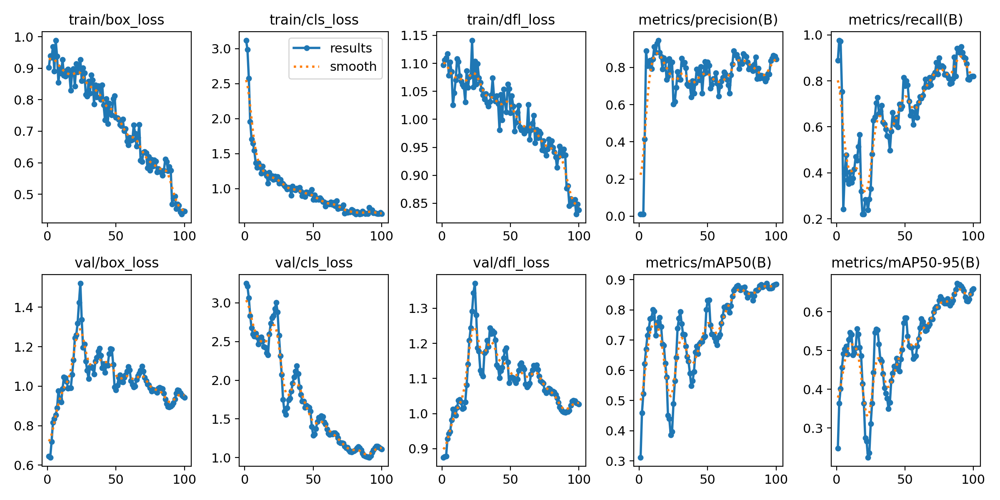

In [ ]:
cv2_imshow(cv2.imread("/content/runs/detect/train/results.png"))

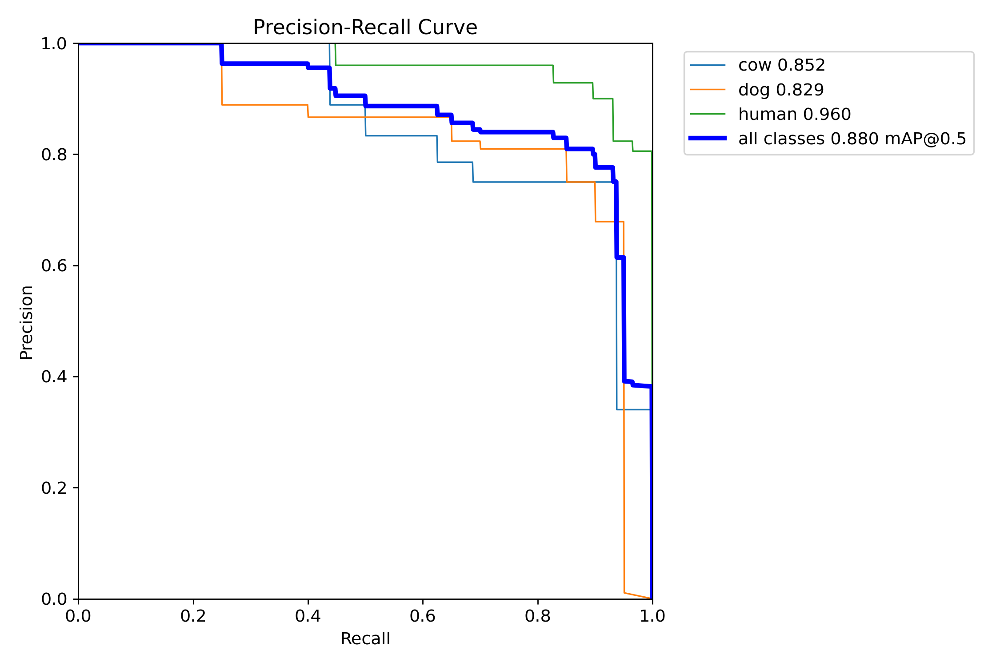

In [ ]:
cv2_imshow(cv2.imread("/content/runs/detect/train/PR_curve.png"))

In [ ]:
# Make predictions.
!yolo task=detect \
mode=predict \
model='/content/runs/detect/train/weights/best.pt' \
source='/content/drive/MyDrive/adl_project/dataset/val/images' \
imgsz=640 \
conf=0.1 \
name='yolov8n_eval'

Ultralytics YOLOv8.2.10 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3006233 parameters, 0 gradients, 8.1 GFLOPs

image 1/20 /content/drive/MyDrive/adl_project/dataset/val/images/test1.jpg: 640x640 1 cow, 1 dog, 280.7ms
image 2/20 /content/drive/MyDrive/adl_project/dataset/val/images/test10.jpg: 448x640 3 cows, 6 dogs, 2 humans, 190.3ms
image 3/20 /content/drive/MyDrive/adl_project/dataset/val/images/test11.jpg: 448x640 1 dog, 176.4ms
image 4/20 /content/drive/MyDrive/adl_project/dataset/val/images/test12.jpg: 448x640 1 dog, 1 human, 178.2ms
image 5/20 /content/drive/MyDrive/adl_project/dataset/val/images/test13.jpg: 544x640 1 dog, 2 humans, 207.1ms
image 6/20 /content/drive/MyDrive/adl_project/dataset/val/images/test14.jpg: 384x640 1 dog, 1 human, 144.1ms
image 7/20 /content/drive/MyDrive/adl_project/dataset/val/images/test15.jpg: 640x416 1 dog, 2 humans, 159.5ms
image 8/20 /content/drive/MyDrive/adl_project/dataset/val/images/test16.j

In [ ]:
# Plot and visualize images in a 2x2 grid.

def visualize(result_dir, num_samples=20):
    """
    Function accepts a list of images and plots them in a 2x2 grid.
    """
    plt.figure(figsize=(100, 100))
    image_names = glob.glob(os.path.join(result_dir, '*.jpg'))
    random.shuffle(image_names)
    for i, image_name in enumerate(image_names):
        image = plt.imread(image_name)
        plt.subplot(20, 1, i+1)
        plt.imshow(image)
        plt.axis('off')
        if i == num_samples-1:
            break
    plt.tight_layout()
    plt.show()

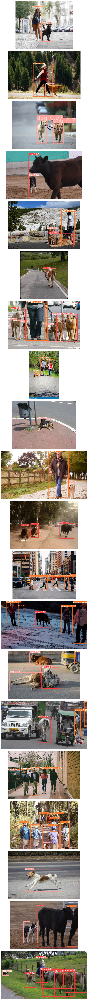

In [ ]:
# Call the visualize function to view the predictions.

visualize('/content/runs/detect/yolov8n_eval2')